# 1. Process the dataset

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 2: Import necessary libraries
import zipfile
import os

# Specify the path to your ZIP file in Google Drive
zip_file_path = '/content/drive/MyDrive/DeepLearning-FinalProject/data_nasdaq_csv.zip'

# Specify the folder where you want to extract the files
extract_folder = '/content/drive/MyDrive/DeepLearning-FinalProject/extracted_files'

# Create the directory if it doesn't exist
if not os.path.exists(extract_folder):
    os.makedirs(extract_folder)

# Step 3: Extract the ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

print(f"Files have been extracted to '{extract_folder}'")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Files have been extracted to '/content/drive/MyDrive/DeepLearning-FinalProject/extracted_files'


In [ ]:
import os
import pandas as pd

# Path to the folder containing CSV files
extract_folder = '/content/drive/MyDrive/DeepLearning-FinalProject/extracted_files/csv'

# List of company tickers and their names
tech_comp = ['CDNS','SNPS','GPRO','DXCM','FTNT','WDC','PLAB','AMZN','MSFT','CPRT','CHTR','MAR','TCX','WIX','OLED','SWKS','CTSH','VRNT','SBUX','NXPI','TXN','QLYS','RMBS','MOMO','QRVO','VRSN','PCAR','SLAB','CMCT','ROST','MELI','CTAS','CSCO','EPAM','AVID','EXPE','GILD','AMD','AAPL','GRPN','MU','COST','REGN','ADBE','INO','INCY','MRVL','ATVI','VRTX','FSLR','ALGN','WBA','ATOS','MCHP','EBAY','ASML','ADSK','VRSK','INFN','TWOU','SYBT','VNET','LOGI','EA','MDLZ','SGEN','AMGN','CHKP','INTC','AMAT','EXTR','JD','CRNT','MSTR','CMCSA','BV','FFIV','FAST','ORLY','PTC','CYBR','NTAP','ADP','LSCC','SPLK','AMBA','KLIC','ENTG','MSCC','NTES','ISRG','LULU','PCTY','SIRI','BIIB','GOGO','SMTC','QCOM','NFLX','FIVN','LRCX','IDXX','DLTR','MNST','NVDA','ON','MPWR','SYNA','HOLI','STX','EGHT','GRMN','ADI','INTU','FORM','WB','UCTT','CAVM','YNDX','ILMN','BIDU']

# Initialize an empty DataFrame for combining
combined_df = pd.DataFrame()

# Iterate over each company ticker in the list
for company in tech_comp:
    # Construct file path
    file_path = os.path.join(extract_folder, f'{company}.csv')

    try:
        # Load the company's CSV file into a DataFrame, handling bad lines
        df = pd.read_csv(file_path, on_bad_lines='skip')

        # Add a new column with the company name (ticker in this case)
        df['company_name'] = company

        # Append the company's data to the combined DataFrame
        combined_df = pd.concat([combined_df, df], ignore_index=True)

    except pd.errors.ParserError as e:
        print(f"Error parsing {file_path}: {e}")

# Display or save the combined DataFrame
print(combined_df)
# Save the combined DataFrame to a new CSV if desired
combined_df.to_csv('/content/drive/MyDrive/DeepLearning-FinalProject/combined_stock_data.csv', index=False)


Error parsing /content/drive/MyDrive/DeepLearning-FinalProject/extracted_files/csv/ON.csv: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.
Error parsing /content/drive/MyDrive/DeepLearning-FinalProject/extracted_files/csv/STX.csv: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.
              Date         Low        Open      Volume        High  \
0       10-06-1987    1.944444    0.000000  10395450.0    2.111111   
1       11-06-1987    1.888889    0.000000   2233350.0    2.027778   
2       12-06-1987    1.888889    0.000000   1120950.0    1.944444   
3       15-06-1987    1.888889    0.000000   1815300.0    1.944444   
4       16-06-1987    1.833333    0.000000    686700.0    1.916667   
...            ...         ...         ...         ...         ...   
765449  06-12-2022  116.269997  118.809998   3244000.0  119.879997   
765450  07-12-2022  112.769997  113.320000   2662200.0  115.900002   
765

# 2. Import the dataset

In [ ]:
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, LSTM
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers.legacy import Adam


In [ ]:
nasdaq_tech = pd.read_csv("/content/drive/MyDrive/DeepLearning-FinalProject/combined_stock_data.csv")
nasdaq_tech

,Date,Low,Open,Volume,High,Close,Adjusted Close,company_name
0,10-06-1987,1.944444,0.000000,10395450.0,2.111111,2.000000,2.000000,CDNS
1,11-06-1987,1.888889,0.000000,2233350.0,2.027778,1.888889,1.888889,CDNS
2,12-06-1987,1.888889,0.000000,1120950.0,1.944444,1.888889,1.888889,CDNS
3,15-06-1987,1.888889,0.000000,1815300.0,1.944444,1.888889,1.888889,CDNS
4,16-06-1987,1.833333,0.000000,686700.0,1.916667,1.833333,1.833333,CDNS
...,...,...,...,...,...,...,...,...
765449,06-12-2022,116.269997,118.809998,3244000.0,119.879997,117.330002,117.330002,BIDU
765450,07-12-2022,112.769997,113.320000,2662200.0,115.900002,114.580002,114.580002,BIDU
765451,08-12-2022,119.050003,119.919998,4337400.0,121.879997,120.330002,120.330002,BIDU
765452,09-12-2022,119.589996,123.260002,3464900.0,124.110001,119.989998,119.989998,BIDU


In [ ]:
# Count distinct the value in company_name columns
nasdaq_tech["company_name"].unique()

array(['CDNS', 'SNPS', 'GPRO', 'DXCM', 'FTNT', 'WDC', 'PLAB', 'AMZN',
       'MSFT', 'CPRT', 'CHTR', 'MAR', 'TCX', 'WIX', 'OLED', 'SWKS',
       'CTSH', 'VRNT', 'SBUX', 'NXPI', 'TXN', 'QLYS', 'RMBS', 'MOMO',
       'QRVO', 'VRSN', 'PCAR', 'SLAB', 'CMCT', 'ROST', 'MELI', 'CTAS',
       'CSCO', 'EPAM', 'AVID', 'EXPE', 'GILD', 'AMD', 'AAPL', 'GRPN',
       'MU', 'COST', 'REGN', 'ADBE', 'INO', 'INCY', 'MRVL', 'ATVI',
       'VRTX', 'FSLR', 'ALGN', 'WBA', 'ATOS', 'MCHP', 'EBAY', 'ASML',
       'ADSK', 'VRSK', 'INFN', 'TWOU', 'SYBT', 'VNET', 'LOGI', 'EA',
       'MDLZ', 'SGEN', 'AMGN', 'CHKP', 'INTC', 'AMAT', 'EXTR', 'JD',
       'CRNT', 'MSTR', 'CMCSA', 'BV', 'FFIV', 'FAST', 'ORLY', 'PTC',
       'CYBR', 'NTAP', 'ADP', 'LSCC', 'SPLK', 'AMBA', 'KLIC', 'ENTG',
       'MSCC', 'NTES', 'ISRG', 'LULU', 'PCTY', 'SIRI', 'BIIB', 'GOGO',
       'SMTC', 'QCOM', 'NFLX', 'FIVN', 'LRCX', 'IDXX', 'DLTR', 'MNST',
       'NVDA', 'MPWR', 'SYNA', 'HOLI', 'EGHT', 'GRMN', 'ADI', 'INTU',
       'FORM', 'WB', 'UC

In [ ]:
# display rows with company_name = AAPL
nasdaq_tech[nasdaq_tech["company_name"] == "AAPL"]

,Date,Low,Open,Volume,High,Close,Adjusted Close,company_name
247056,12-12-1980,0.128348,0.128348,469033600.0,0.128906,0.128348,0.099874,AAPL
247057,15-12-1980,0.121652,0.122210,175884800.0,0.122210,0.121652,0.094663,AAPL
247058,16-12-1980,0.112723,0.113281,105728000.0,0.113281,0.112723,0.087715,AAPL
247059,17-12-1980,0.115513,0.115513,86441600.0,0.116071,0.115513,0.089886,AAPL
247060,18-12-1980,0.118862,0.118862,73449600.0,0.119420,0.118862,0.092492,AAPL
...,...,...,...,...,...,...,...,...
257641,06-12-2022,141.919998,147.070007,64727200.0,147.300003,142.910004,142.910004,AAPL
257642,07-12-2022,140.000000,142.190002,69721100.0,143.369995,140.940002,140.940002,AAPL
257643,08-12-2022,141.100006,142.360001,62128300.0,143.520004,142.649994,142.649994,AAPL
257644,09-12-2022,140.899994,142.339996,76069500.0,145.570007,142.160004,142.160004,AAPL


In [ ]:
# print minimum date
print(nasdaq_tech["Date"].min())
# print maximum date
print(nasdaq_tech["Date"].max())

01-02-1973
31-12-2021


In [ ]:
nasdaq_tech.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765454 entries, 0 to 765453
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Date            765454 non-null  object 
 1   Low             763140 non-null  float64
 2   Open            763140 non-null  float64
 3   Volume          763140 non-null  float64
 4   High            763139 non-null  float64
 5   Close           763139 non-null  float64
 6   Adjusted Close  763139 non-null  float64
 7   company_name    765454 non-null  object 
dtypes: float64(6), object(2)
memory usage: 46.7+ MB


In [ ]:
nasdaq_tech.columns

Index(['Date', 'Low', 'Open', 'Volume', 'High', 'Close', 'Adjusted Close',
       'company_name'],
      dtype='object')

In [ ]:
df = nasdaq_tech.copy()

In [ ]:
tech_df = nasdaq_tech.groupby(["company_name"]).median(["Open", "High", "Low", "Close", "Adjusted Close", "Volume"])

In [ ]:
tech_df

,Low,Open,Volume,High,Close,Adjusted Close
company_name,,,,,,
AAPL,0.477500,0.484375,215124000.0,0.493304,0.484375,0.401782
ADBE,25.700001,26.309999,5087850.0,26.855000,26.275001,26.225187
ADI,27.195001,27.680000,2017850.0,28.150000,27.670000,18.795736
ADP,32.163235,32.594933,1756087.0,33.015741,32.664326,21.357487
ADSK,13.430000,13.680000,2273900.0,14.015625,13.805000,13.760982
...,...,...,...,...,...,...
WB,41.215000,42.004999,1266650.0,42.890001,41.980001,41.980001
WBA,29.455000,29.933750,2790500.0,30.230000,29.875000,21.551516
WDC,10.330000,10.660000,1667000.0,10.900000,10.625000,8.342289


# 3. Stock Prediction


## Functions

### Helper function

In [ ]:
### Split the dataset into time windows to get data samples.
# Only get the close price (index 4 in the data frame)

def split_into_windows(company_data, window_size, X_data, y_data):
  for i in range(0, len(company_data) - window_size - 1):
    # first = company_data.iloc[i, 4]
    data_feature = []
    data_label = []

    # Get a window_size time frame for data feature
    for j in range(window_size):
        data_feature.append(company_data.iloc[i + j, 4])

    # Next value is the label (price of the next day) to be predicted
    data_label.append(company_data.iloc[i + window_size, 4])

    # Append new data sample (feature and label) to X_data and y_data
    X_data.append(np.array(data_feature).reshape(window_size, 1))
    y_data.append(np.array(data_label))

In [ ]:
### Split the data into training, validation and test set
# Split data into train, val and test. Note that 'shuffle=False' due to time-series data.

def train_val_test_split(X_data, y_data, window_size):
  X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, shuffle=False)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)

  # Convert from lists to Numpy arrays for reshaping purpose
  X_train = np.array(X_train)
  X_val = np.array(X_val)
  X_test = np.array(X_test)
  y_train = np.array(y_train)
  y_val = np.array(y_val)
  y_test = np.array(y_test)

  # Reshape the numpy array to fit the neural network input shape requirement
  X_train = X_train.reshape(X_train.shape[0], window_size, 1)
  X_val = X_val.reshape(X_val.shape[0], window_size, 1)
  X_test = X_test.reshape(X_test.shape[0], window_size, 1)

  return X_train, y_train, X_val, y_val, X_test, y_test

In [ ]:
### Normalization
def normalize(X_train, y_train, X_val, y_val):
  # MinMax normalize the training data: x=(x-min(x)/(max(x)-min(x))
  X_train_norm = X_train.copy()
  y_train_norm = y_train.copy()
  for i in range(0, len(X_train)):
      min_feature = np.min(X_train[i])
      max_feature = np.max(X_train[i])
      X_train_norm[i] = (X_train[i] - min_feature) / (max_feature - min_feature)
      y_train_norm[i] = (y_train[i] - min_feature) / (max_feature - min_feature)

  # MinMax normalize the validation data: x=(x-min(x)/(max(x)-min(x))
  X_val_norm = X_val.copy()
  y_val_norm = y_val.copy()
  for i in range(0, len(X_val)):
      min_feature = np.min(X_val[i])
      max_feature = np.max(X_val[i])
      X_val_norm[i] = (X_val[i] - min_feature) / (max_feature - min_feature)
      y_val_norm[i] = (y_val[i] - min_feature) / (max_feature - min_feature)

  return X_train_norm, y_train_norm, X_val_norm, y_val_norm

In [ ]:
### Create and train the model
import keras
from keras.models import Sequential
from keras.layers import Conv1D, Input, Flatten, Dense
def build_model(window_size):
  # Build the model architecture
  model = tf.keras.Sequential()
  # model.add(LSTM(units = 64, return_sequences = True))
  model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(window_size, 1), padding='same'))
  model.add(MaxPooling1D(pool_size=2))
  model.add(Conv1D(128, kernel_size=3, activation='relu', padding='same'))
  model.add(MaxPooling1D(2))
  model.add(Conv1D(64, kernel_size=3, activation='relu', padding='same'))
  model.add(MaxPooling1D(2))
  model.add(Flatten())
  model.add(Dense(100, activation='relu'))
  model.add(Dense(1)) # By default: activation='linear', i.e., passing through f(x) = x
  model.summary()

  return model



In [ ]:
window_size = 30

In [ ]:
model = tf.keras.Sequential()
# model.add(LSTM(units = 64, return_sequences = True))
model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(window_size, 1), padding='same'))
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(128, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling1D(2))
model.add(Conv1D(64, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling1D(2))
model.add(Flatten())
model.add(Dense(100, activation='relu'))
model.add(Dense(1)) # By default: activation='linear', i.e., passing through f(x) = x
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)                    │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_6 (MaxPooling1D)       │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_7 (Conv1D)                    │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_7 (MaxPooling1D)       │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_8 (Conv1D)                    │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_8 (MaxPooling1D)       │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def MinMaxScaling(X_test):
  # MinMax normalize the test data: norm_x = (x-min(x) / (max(x) - min(x))
  X_test_norm = X_test.copy()
  for i in range(0, len(X_test)):
      min_feature = np.min(X_test[i])
      max_feature = np.max(X_test[i])
      X_test_norm[i] = (X_test[i] - min_feature) / (max_feature - min_feature)

  return X_test_norm

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def generate_features_prediction(company_data, window_size):
    # Select the relevant features: Low, High, Open, Close, Adjusted Close, Volume
    feature_columns = ['Low', 'High', 'Open', 'Volume']

    # Extract the last 'window_size' rows for the selected features
    X_predict_original = company_data[feature_columns].iloc[len(company_data) - window_size : len(company_data)]

    # Convert from DataFrame to Numpy array for reshaping
    X_predict = np.array(X_predict_original)

    # Ensure the correct shape: (samples, window_size, num_features)
    # The model expects shape: (batch_size, window_size, 6)
    X_predict = X_predict.reshape(1, window_size, len(feature_columns))  # Shape: (1, window_size, 6)

    # Normalize the test data using MinMax normalization
    X_predict_norm = X_predict.copy()

    for i in range(X_predict.shape[1]):  # Iterate over time steps
        min_feature = np.min(X_predict[:, i, :], axis=0)
        max_feature = np.max(X_predict[:, i, :], axis=0)
        X_predict_norm[:, i, :] = (X_predict[:, i, :] - min_feature) / (max_feature - min_feature + 1e-7)

    return X_predict, X_predict_norm



In [ ]:
def predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        # Reshape y_pred_norm to match the number of features in X_predict_norm
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions)

    # Check if k is valid (this is to prevent index errors)
    if k > len(predictions):
        raise ValueError("k is larger than the number of predictions available.")

    # Return all predictions made
    return predictions  # Return all predictions for analysis


## kth day

In [ ]:
def kth_day_pipeline(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    # Debugging by checking input shape
    # print("Input Shape:", model.input_shape)
    # print("Output Shape:", model.output_shape)
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    # Get prediction on the test data
    # print shape
    # print("Output Shape:", model.output_shape)
    # print("Input Shape:", model.input_shape)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., de-normalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)  # Prepare an array for denormalized predictions
    for i in range(len(y_pred_denorm)):  # denorm_x = norm_x * (max(x) - min(x)) + min(x)
        min_feature = np.min(X_test[i])
        # print("y_pred min feature", min_feature.shape)
        max_feature = np.max(X_test[i])
        # print("y_pred max",max_feature.shape)
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature
        # print("y_pred denorm",y_pred_denorm.shape)

    ### Prediction for k-th day
    try:
      X_predict, X_predict_norm = generate_features_prediction(company_data, window_size)
    except:
      # print("Generate done!")
      print("Bug r")
    kth_day_stock_price = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
    print("Prediction process done!")
    # Ensure kth_day_stock_price is a scalar
    if np.ndim(kth_day_stock_price) > 0:
        kth_day_stock_price = kth_day_stock_price[0]  # Take the first element if it's an array

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)

    # Ensure y_pred_denorm has the correct length for plotting
    days_range = np.arange(len(y_pred_denorm))  # x-axis for predicted prices
    plt.plot(days_range, y_pred_denorm, label='Predicted price', color='blue')

    # Check the length of y_test to avoid size mismatch
    real_days_range = np.arange(len(y_test))  # x-axis for real prices
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real price', color='green')

    # Adjust the x-axis for the predicted k-th day
    plt.axvline(x=len(y_pred_denorm)-1 + k, color='red', linestyle='--', label=f'Predicted price on day {k}')

    # Scatter plot for the k-th day stock price
    plt.scatter(len(y_pred_denorm) + k - 1, kth_day_stock_price, color='red', label='Predicted kth Day Price')

    plt.title(f'Stock price prediction for the {k}-th day ahead - {company}', fontsize=16)
    plt.xlabel('Time (days)', fontsize=14)
    plt.ylabel('Close price in $', fontsize=14)
    plt.grid()  # Add grid
    plt.legend()  # Add legend
    plt.show()



X_train_norm shape:  (6700, 120, 1)
y_train_norm shape:  (6700, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_129 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_129 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_130 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_130 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_131 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_131 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_43 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_86 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_87 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 5.5898 - mse: 5.5898 - val_loss: 0.0881 - val_mse: 0.0881
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0853 - mse: 0.0853 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0344 - mse: 0.0344 - val_loss: 0.0196 - val_mse: 0.0196
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0090 - mse: 0.0090 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.00

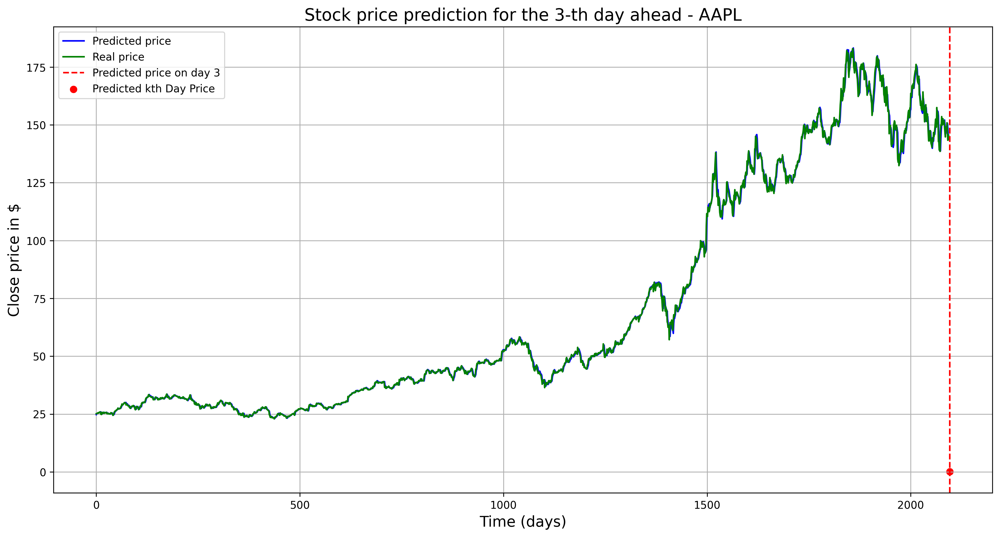

X_train_norm shape:  (5783, 120, 1)
y_train_norm shape:  (5783, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_132 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_132 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_133 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_133 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_134 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_134 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_44 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_88 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_89 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 4.4665 - mse: 4.4665 - val_loss: 0.1195 - val_mse: 0.1195
Epoch 2/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0848 - mse: 0.0848 - val_loss: 0.0368 - val_mse: 0.0368
Epoch 3/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0303 - val_mse: 0.0303
Epoch 4/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 5/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0180 - mse: 0.0180 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 6/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 7/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 8/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0090 - mse: 0.0090 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 9/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.00

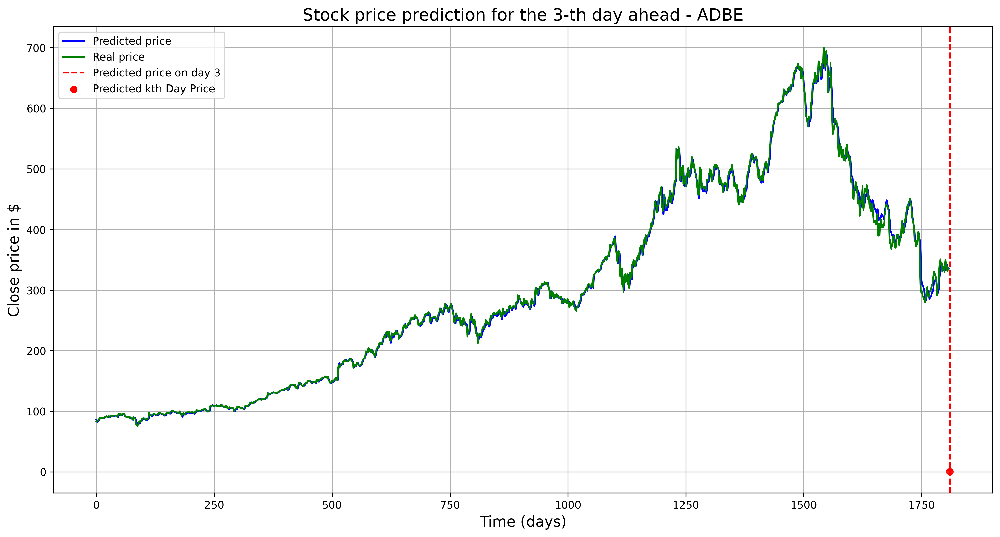

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_135 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_135 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_136 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_136 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_137 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_137 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_45 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_90 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_91 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 8s 273ms/step - loss: 4.0543 - mse: 4.0543 - val_loss: 0.0909 - val_mse: 0.0909
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0725 - mse: 0.0725 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0268 - mse: 0.0268 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.00

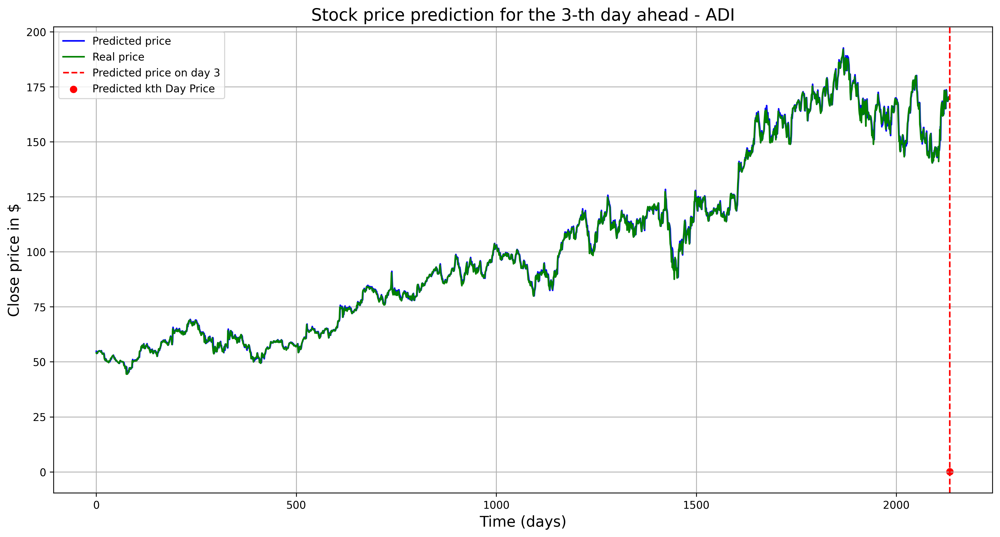

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_138 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_138 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_139 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_139 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_140 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_140 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_46 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_92 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_93 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.4432 - mse: 0.4432 - val_loss: 0.1239 - val_mse: 0.1239
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0967 - mse: 0.0967 - val_loss: 0.0573 - val_mse: 0.0573
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0453 - mse: 0.0453 - val_loss: 0.0171 - val_mse: 0.0171
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0145 - mse: 0.0145 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.006

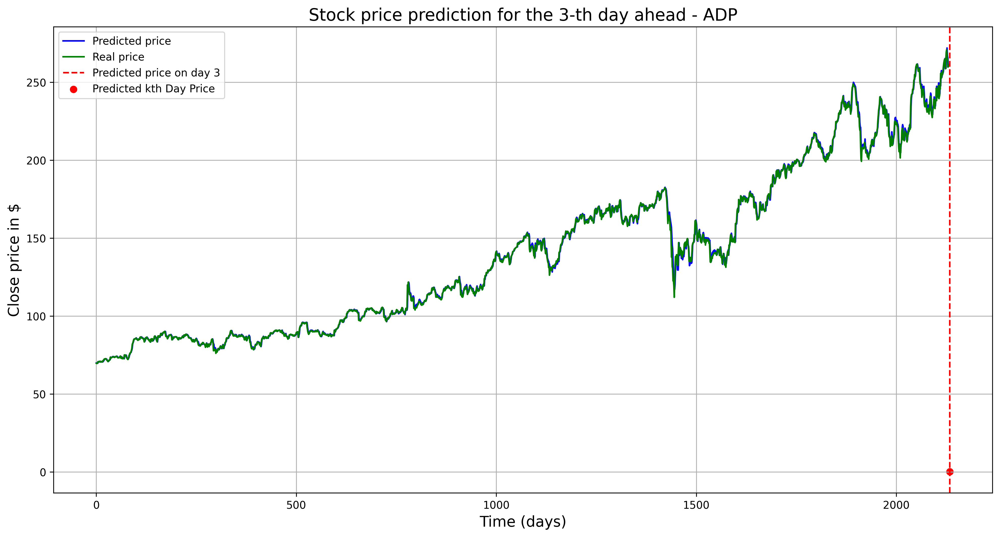

X_train_norm shape:  (5964, 120, 1)
y_train_norm shape:  (5964, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_141 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_141 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_142 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_142 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_143 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_143 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_47 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_94 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_95 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 1.1616 - mse: 1.1616 - val_loss: 0.1153 - val_mse: 0.1153
Epoch 2/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0923 - mse: 0.0923 - val_loss: 0.0504 - val_mse: 0.0504
Epoch 3/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0406 - mse: 0.0406 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 4/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 5/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 6/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0087 - mse: 0.0087 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 7/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 8/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0068 - mse: 0.0068 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 9/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.00

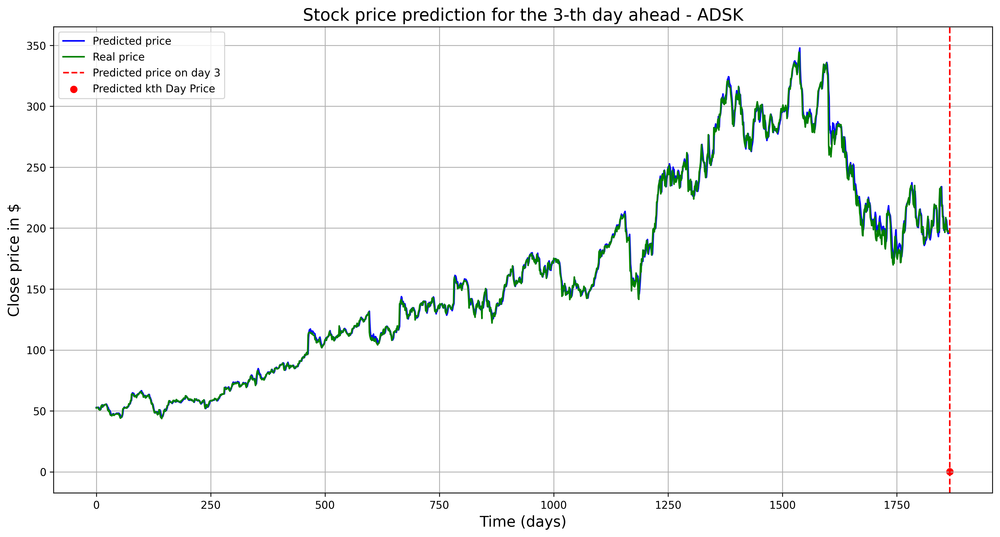

X_train_norm shape:  (3444, 120, 1)
y_train_norm shape:  (3444, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_144 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_144 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_145 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_145 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_146 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_146 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_48 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_96 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_97 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - loss: 3.8885 - mse: 3.8885 - val_loss: 0.7294 - val_mse: 0.7294
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.2913 - mse: 0.2913 - val_loss: 0.2446 - val_mse: 0.2446
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1165 - mse: 0.1165 - val_loss: 0.0483 - val_mse: 0.0483
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0567 - mse: 0.0567 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0431 - mse: 0.0431 - val_loss: 0.0441 - val_mse: 0.0441
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0270 - mse: 0.0270 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0234 - mse: 0.0234 -

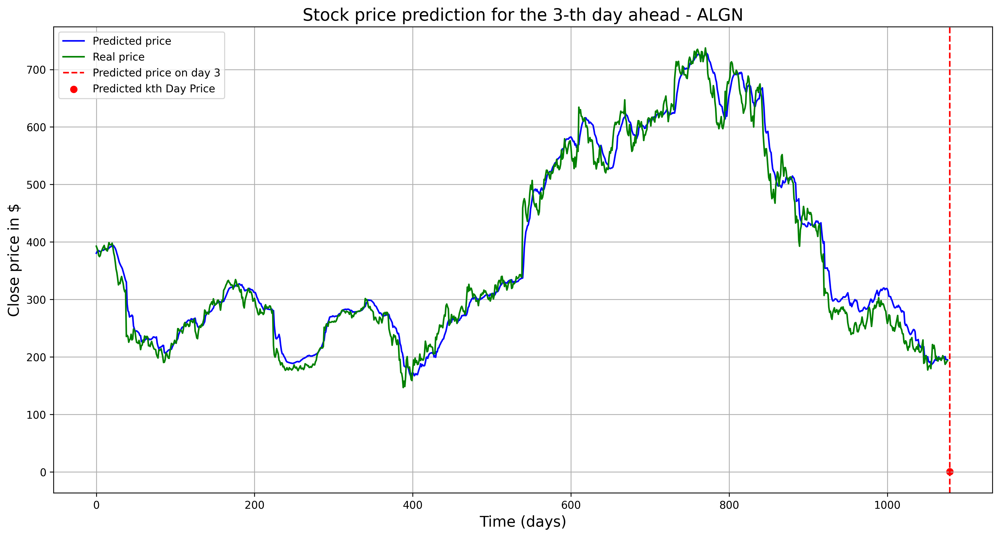

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_147 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_147 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_148 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_148 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_149 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_149 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_49 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_98 (Dense)                     │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_99 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 1.0731 - mse: 1.0731 - val_loss: 0.0999 - val_mse: 0.0999
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0993 - mse: 0.0993 - val_loss: 0.0590 - val_mse: 0.0590
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0499 - mse: 0.0499 - val_loss: 0.0378 - val_mse: 0.0378
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0343 - mse: 0.0343 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0245 - mse: 0.0245 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0152 - mse: 0.0152 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0076 - mse: 0.0076 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.00

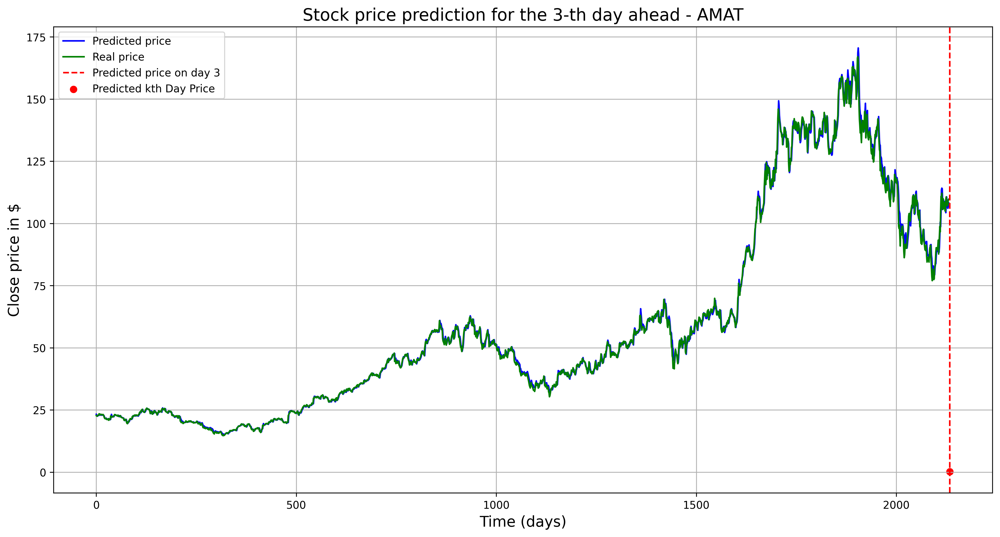

X_train_norm shape:  (1560, 120, 1)
y_train_norm shape:  (1560, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_150 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_150 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_151 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_151 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_152 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_152 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_50 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_100 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_101 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 416ms/step - loss: 1.1065 - mse: 1.1065 - val_loss: 0.3685 - val_mse: 0.3685
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2997 - mse: 0.2997 - val_loss: 0.1245 - val_mse: 0.1245
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1599 - mse: 0.1599 - val_loss: 0.1175 - val_mse: 0.1175
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1344 - mse: 0.1344 - val_loss: 0.0751 - val_mse: 0.0751
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1183 - mse: 0.1183 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0940 - mse: 0.0940 - val_loss: 0.0825 - val_mse: 0.0825
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0737 - mse: 0.0737 - val_loss: 0.0619 - val_mse: 0.0619
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0797 - val_mse: 0.0797
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0509 - mse: 0.0509 -

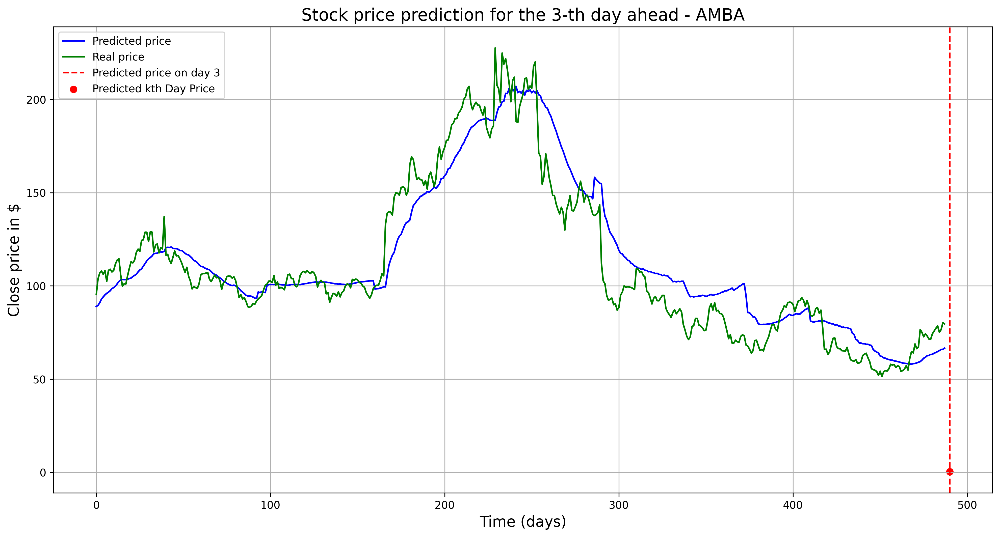

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_153 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_153 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_154 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_154 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_155 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_155 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_51 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_102 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_103 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 230ms/step - loss: 7.5730 - mse: 7.5730 - val_loss: 0.0918 - val_mse: 0.0918
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0820 - mse: 0.0820 - val_loss: 0.0384 - val_mse: 0.0384
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0317 - mse: 0.0317 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0102 - val_mse: 0.0102
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0100 - mse: 0.0100 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0068 - mse: 0.0068 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.00

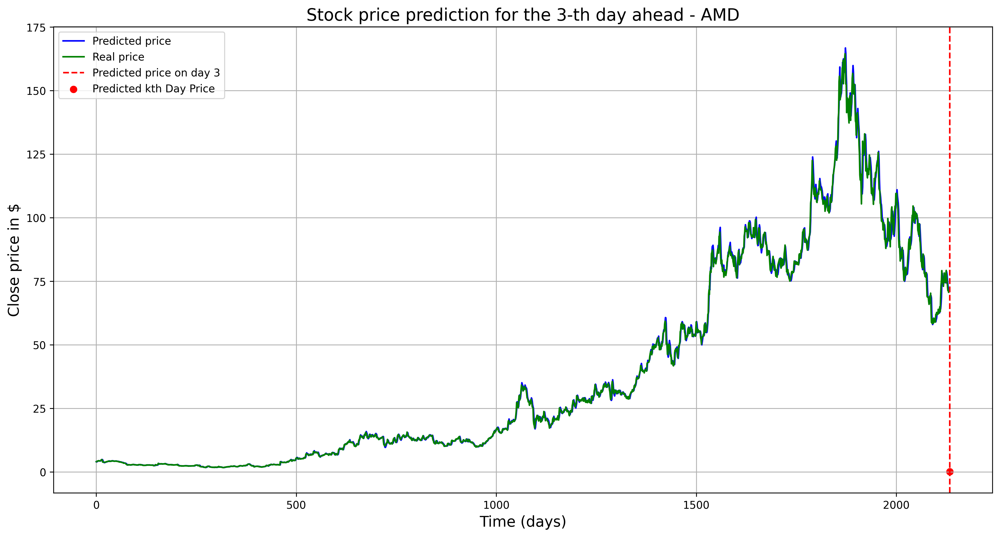

X_train_norm shape:  (6293, 120, 1)
y_train_norm shape:  (6293, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_156 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_156 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_157 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_157 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_158 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_158 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_52 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_104 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_105 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - loss: 3.9411 - mse: 3.9411 - val_loss: 0.0721 - val_mse: 0.0721
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0694 - mse: 0.0694 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0315 - mse: 0.0315 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0213 - mse: 0.0213 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0167 - mse: 0.0167 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0111 - mse: 0.0111 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 9/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.00

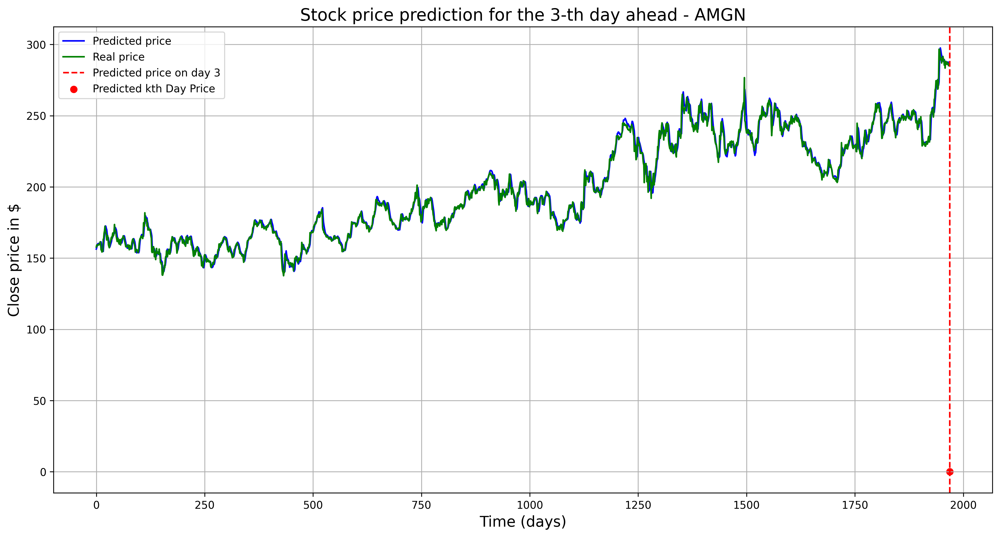

In [ ]:
# Storing the company name
tech_company = tech_df.reset_index().company_name.values[:10]  # First 10 companies
tech_company

# Train the model
for company in tech_company:
  window_size = 120
  # num_features= 6
  company_data = nasdaq_tech[nasdaq_tech.company_name == company]
  kth_day_pipeline(company, company_data, window_size, 3)

## k consecutive

In [ ]:
def predict_consecutive_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions).flatten()  # Flatten to 1D array for easier access

    return predictions  # Return all predictions for analysis


In [ ]:
def kth_consecutive_pipeline(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., denormalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)  # Prepare an array for denormalized predictions
    for i in range(len(y_pred_denorm)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature

    ### Prediction for k-th day
    try:
        X_predict, X_predict_norm = generate_features_prediction(company_data, window_size)
    except Exception as e:
        print("Error generating features for prediction:", e)

    # Predicting prices for k consecutive days
    kth_day_stock_prices = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
    print("Prediction process done!")

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)

    # Ensure y_pred_denorm has the correct length for plotting
    days_range = np.arange(len(y_pred_denorm))  # x-axis for predicted prices
    plt.plot(days_range, y_pred_denorm, label='Predicted price', color='blue')

    # Check the length of y_test to avoid size mismatch
    real_days_range = np.arange(len(y_test))  # x-axis for real prices
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real price', color='green')

    # Scatter plot and annotations for each of the k predicted days
    for i in range(k):
        predicted_day_index = len(y_pred_denorm) + i  # Index for the k-th day
        # Ensure kth_day_stock_prices[i] is accessed correctly as a single value
        predicted_price = kth_day_stock_prices[i] if np.ndim(kth_day_stock_prices) == 1 else kth_day_stock_prices[i][0]  # Change this line accordingly
        plt.scatter(predicted_day_index, predicted_price, color='red', label=f'Predicted Day {i+1}: ${predicted_price:.2f}')
        plt.annotate(f'${predicted_price:.2f}',
                    xy=(predicted_day_index, predicted_price),
                    xytext=(predicted_day_index + 0.5, predicted_price + 5),  # Adjust text position as needed
                    arrowprops=dict(facecolor='black', arrowstyle='->'),
                    fontsize=12)

    # Add vertical line for the k-th day prediction point
    plt.axvline(x=len(y_pred_denorm) + k - 1, color='red', linestyle='--', label=f'Forecast point for day {k}')

    plt.title(f'Stock Price Prediction for the Next {k} Days Ahead - {company}', fontsize=16)
    plt.xlabel('Time (days)', fontsize=14)
    plt.ylabel('Close Price in $', fontsize=14)
    plt.grid()  # Add grid
    plt.legend()  # Add legend
    plt.tight_layout()  # Adjust layout to make space for annotations
    plt.show()

X_train_norm shape:  (6700, 120, 1)
y_train_norm shape:  (6700, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_222 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_222 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_223 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_223 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_224 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_224 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_74 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_148 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_149 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 5.8899 - mse: 5.8899 - val_loss: 0.2141 - val_mse: 0.2141
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.1293 - mse: 0.1293 - val_loss: 0.0883 - val_mse: 0.0883
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0689 - mse: 0.0689 - val_loss: 0.0446 - val_mse: 0.0446
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0153 - mse: 0.0153 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0115 - mse: 0.0115 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.009

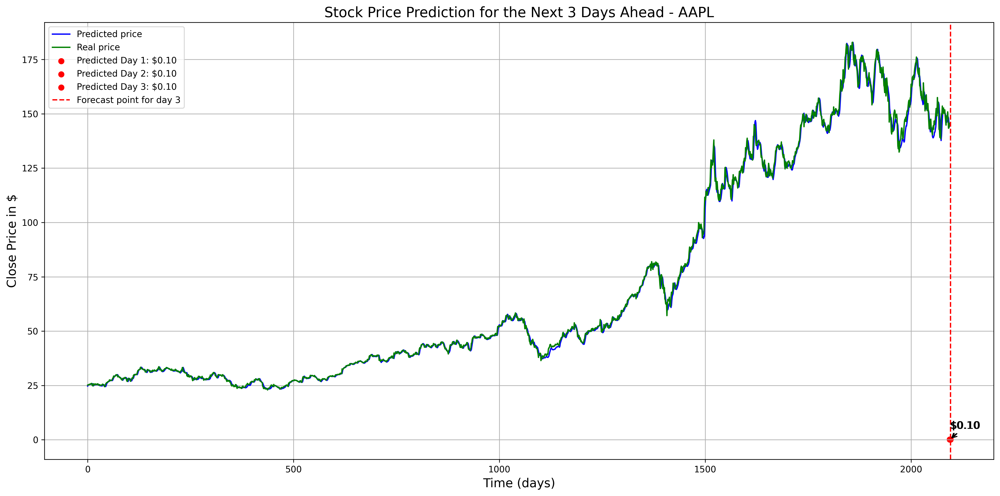

X_train_norm shape:  (5783, 120, 1)
y_train_norm shape:  (5783, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_225 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_225 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_226 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_226 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_227 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_227 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_75 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_150 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_151 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 1.5750 - mse: 1.5750 - val_loss: 0.0914 - val_mse: 0.0914
Epoch 2/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0790 - mse: 0.0790 - val_loss: 0.0340 - val_mse: 0.0340
Epoch 3/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0374 - mse: 0.0374 - val_loss: 0.0258 - val_mse: 0.0258
Epoch 4/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0231 - mse: 0.0231 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 5/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0149 - mse: 0.0149 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 6/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0093 - mse: 0.0093 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 7/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 8/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 9/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.00

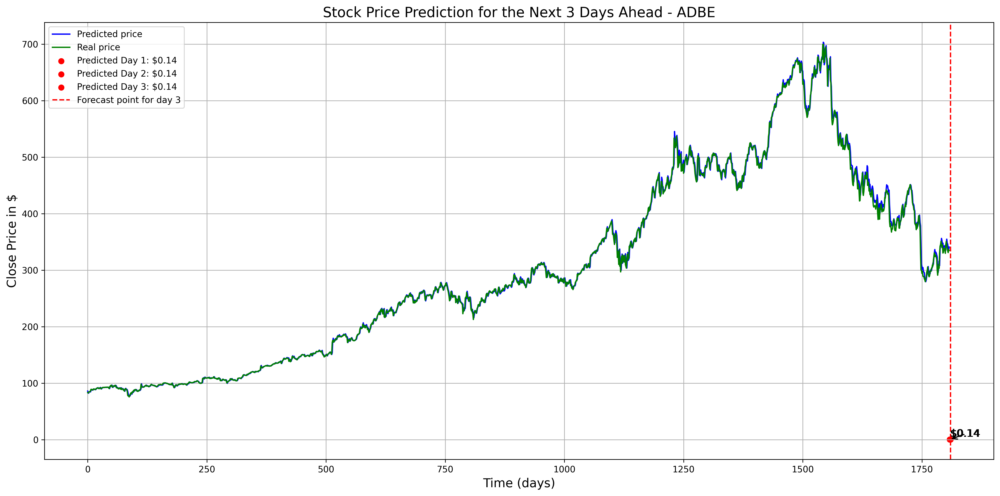

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_228 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_228 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_229 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_229 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_230 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_230 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_76 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_152 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_153 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 10.0620 - mse: 10.0620 - val_loss: 0.1079 - val_mse: 0.1079
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0863 - mse: 0.0863 - val_loss: 0.0439 - val_mse: 0.0439
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0402 - mse: 0.0402 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0256 - mse: 0.0256 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0198 - mse: 0.0198 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0136 - mse: 0.0136 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0108 - mse: 0.0108 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0

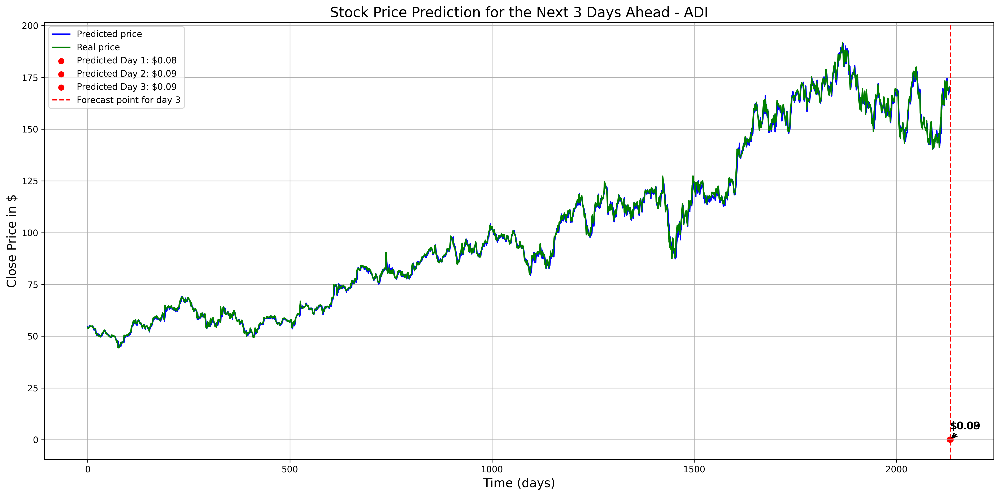

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_231 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_231 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_232 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_232 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_233 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_233 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_77 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_154 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_155 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 4.7624 - mse: 4.7624 - val_loss: 0.1385 - val_mse: 0.1385
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.1074 - mse: 0.1074 - val_loss: 0.0680 - val_mse: 0.0680
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0603 - mse: 0.0603 - val_loss: 0.0352 - val_mse: 0.0352
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0174 - mse: 0.0174 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0094 - mse: 0.0094 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0083 - mse: 0.0083 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0074 - mse: 0.0074 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.00

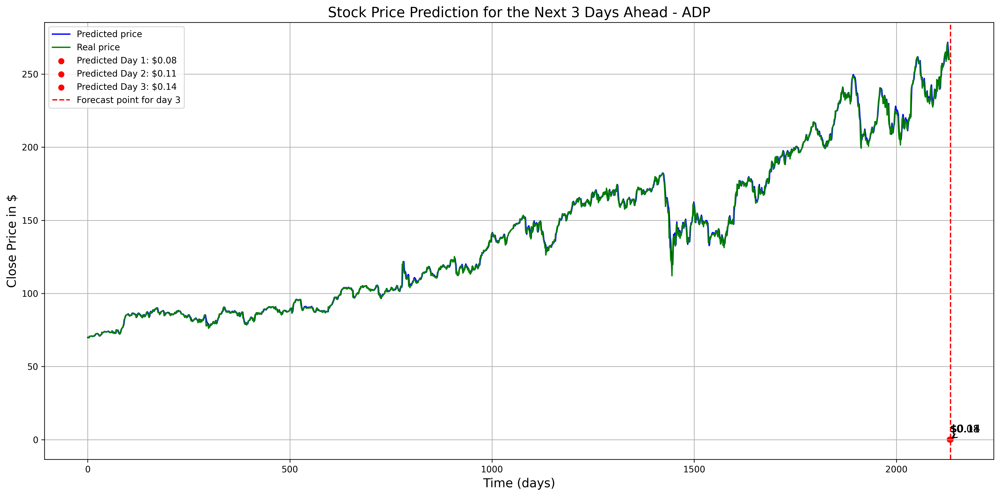

X_train_norm shape:  (5964, 120, 1)
y_train_norm shape:  (5964, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_234 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_234 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_235 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_235 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_236 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_236 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_78 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_156 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_157 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - loss: 2.8494 - mse: 2.8494 - val_loss: 0.1864 - val_mse: 0.1864
Epoch 2/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1293 - mse: 0.1293 - val_loss: 0.0887 - val_mse: 0.0887
Epoch 3/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0675 - mse: 0.0675 - val_loss: 0.0440 - val_mse: 0.0440
Epoch 4/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0455 - mse: 0.0455 - val_loss: 0.0353 - val_mse: 0.0353
Epoch 5/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0288 - val_mse: 0.0288
Epoch 6/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0274 - mse: 0.0274 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 7/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0234 - mse: 0.0234 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 8/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0179 - mse: 0.0179 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 9/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.01

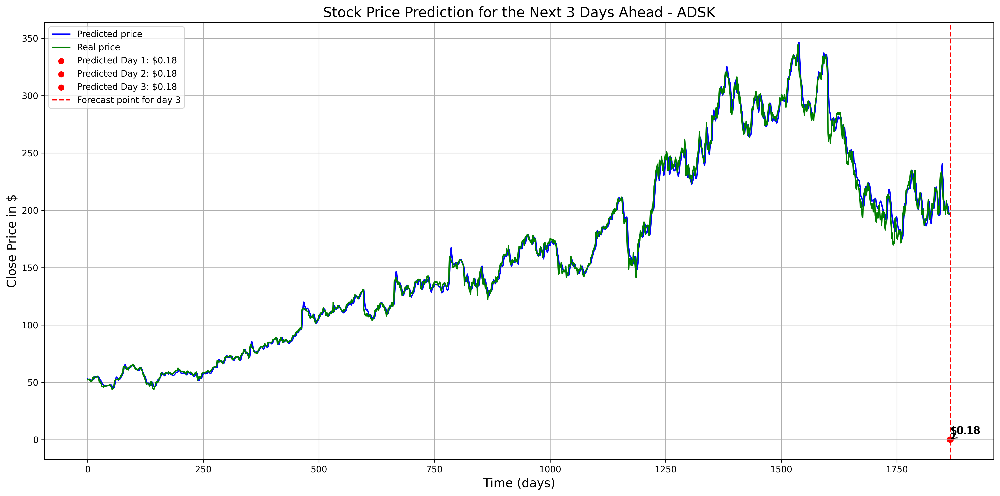

X_train_norm shape:  (3444, 120, 1)
y_train_norm shape:  (3444, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_237 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_237 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_238 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_238 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_239 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_239 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_79 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_158 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_159 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - loss: 3.8811 - mse: 3.8811 - val_loss: 0.0667 - val_mse: 0.0667
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1194 - mse: 0.1194 - val_loss: 0.0495 - val_mse: 0.0495
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0362 - mse: 0.0362 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0202 - mse: 0.0202 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0161 - mse: 0.0161 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0142 - mse: 0.0142 -

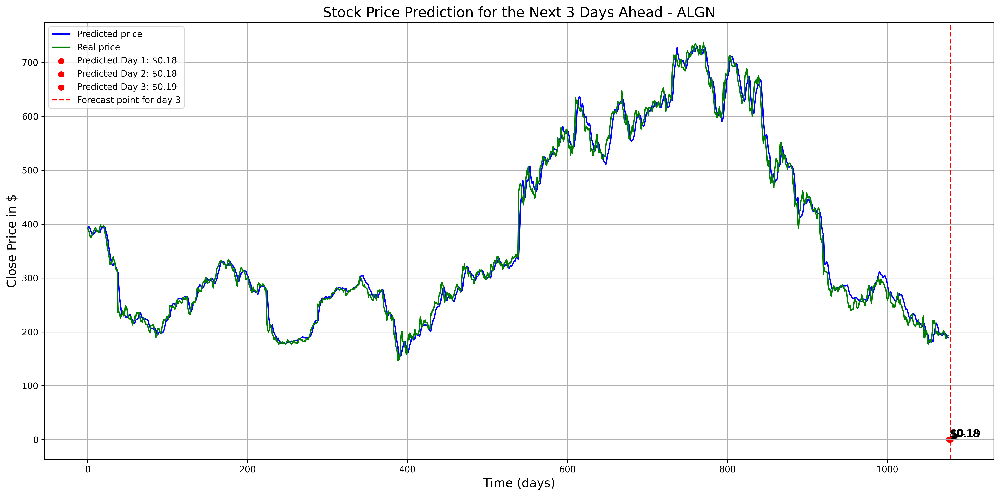

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_240 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_240 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_241 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_241 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_242 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_242 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_80 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_160 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_161 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 5.1140 - mse: 5.1140 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0434 - mse: 0.0434 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.00

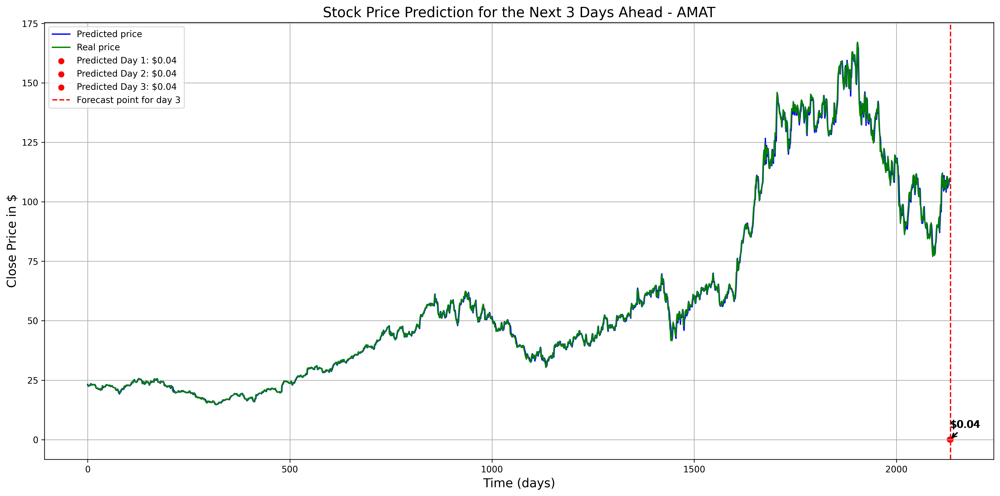

X_train_norm shape:  (1560, 120, 1)
y_train_norm shape:  (1560, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_243 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_243 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_244 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_244 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_245 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_245 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_81 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_162 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_163 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 368ms/step - loss: 4.4758 - mse: 4.4758 - val_loss: 0.3368 - val_mse: 0.3368
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2589 - mse: 0.2589 - val_loss: 0.0826 - val_mse: 0.0826
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1115 - mse: 0.1115 - val_loss: 0.0681 - val_mse: 0.0681
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0614 - mse: 0.0614 - val_loss: 0.0705 - val_mse: 0.0705
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0498 - mse: 0.0498 - val_loss: 0.0497 - val_mse: 0.0497
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0377 - mse: 0.0377 - val_loss: 0.0520 - val_mse: 0.0520
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0335 - mse: 0.0335 - val_loss: 0.0431 - val_mse: 0.0431
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0212 - mse: 0.0212 -

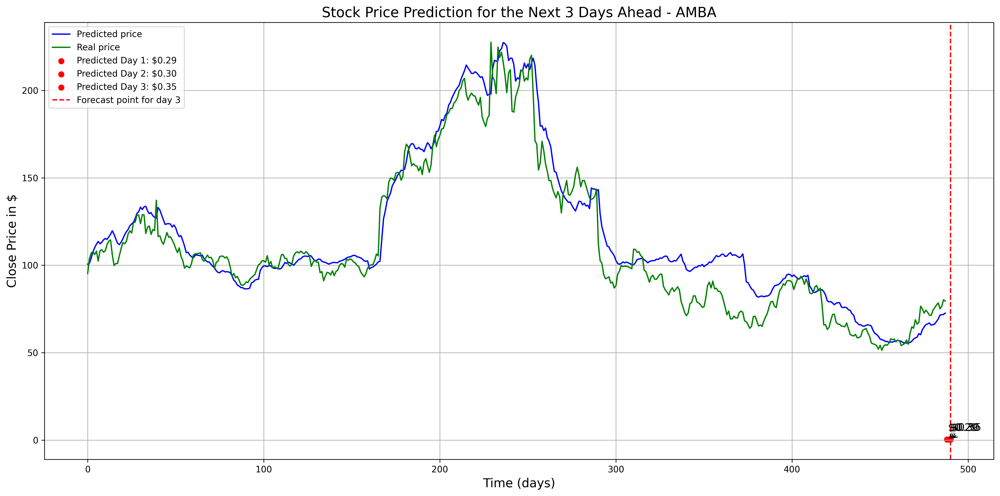

X_train_norm shape:  (6820, 120, 1)
y_train_norm shape:  (6820, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_246 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_246 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_247 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_247 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_248 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_248 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_82 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_164 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_165 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 1.5555 - mse: 1.5555 - val_loss: 0.1007 - val_mse: 0.1007
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0929 - mse: 0.0929 - val_loss: 0.0388 - val_mse: 0.0388
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0360 - mse: 0.0360 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0154 - mse: 0.0154 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0069 - mse: 0.0069 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 8/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 9/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.00

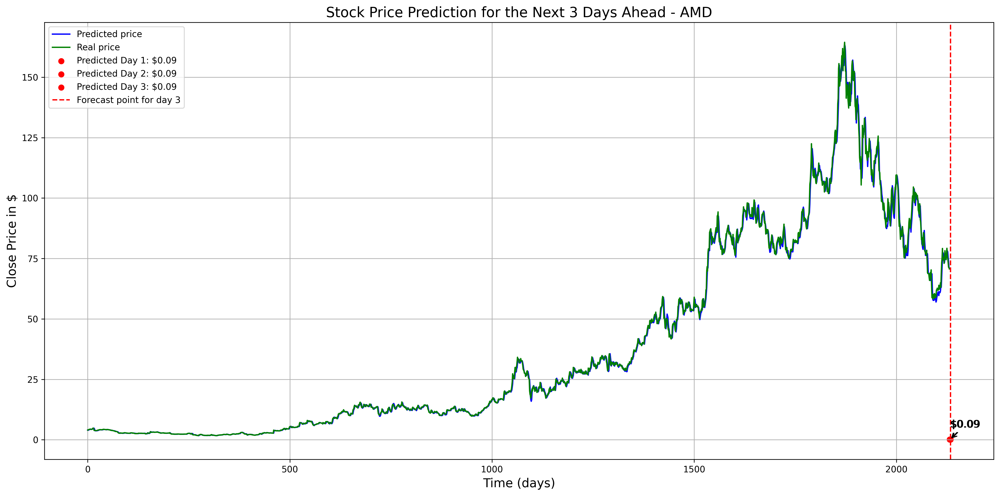

X_train_norm shape:  (6293, 120, 1)
y_train_norm shape:  (6293, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_249 (Conv1D)                  │ (None, 120, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_249 (MaxPooling1D)     │ (None, 60, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_250 (Conv1D)                  │ (None, 60, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_250 (MaxPooling1D)     │ (None, 30, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_251 (Conv1D)                  │ (None, 30, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_251 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_83 (Flatten)                 │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_166 (Dense)                    │ (None, 100)                 │          96,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_167 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 145,801 (569.54 KB)

 Trainable params: 145,801 (569.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.5148 - mse: 0.5148 - val_loss: 0.1002 - val_mse: 0.1002
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0851 - mse: 0.0851 - val_loss: 0.0498 - val_mse: 0.0498
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0074 - mse: 0.0074 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 9/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.00

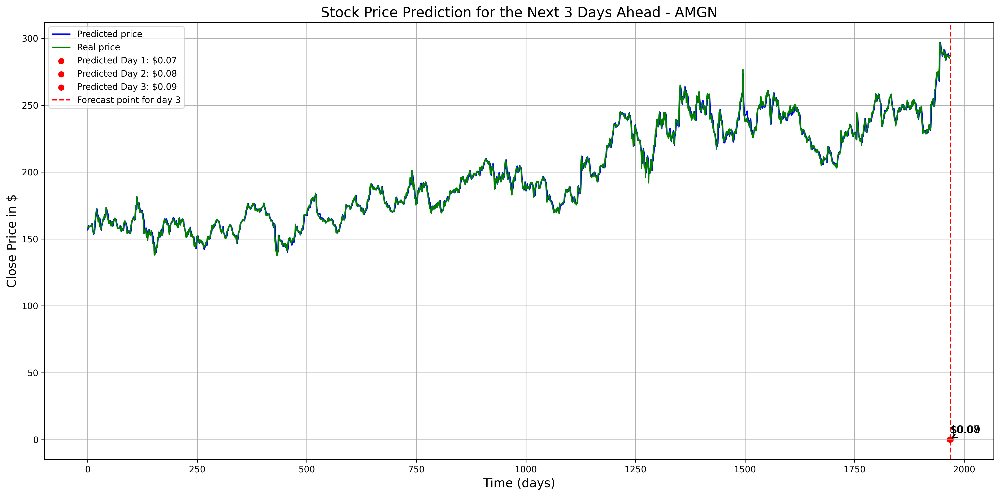

In [ ]:
# Storing the company name
tech_company = tech_df.reset_index().company_name.values[:10]  # First 10 companies
tech_company

# Train the model
for company in tech_company:
  window_size = 120
  company_data = nasdaq_tech[nasdaq_tech.company_name == company]
  kth_consecutive_pipeline(company, company_data, window_size, 3)